In [1]:
from os.path import join
from textwrap import shorten 
from matplotlib import pyplot as plt

import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
from matplotlib.backends.backend_pdf import PdfPages
import sklearn
from collections import Counter

from misc_util.logutils import setup_logging
from misc_util.pretty_print import display

from derive_conceptualspace.pipeline import SnakeContext, load_envfiles
from derive_conceptualspace.settings import DEFAULT_N_CPUS
from derive_conceptualspace.util.result_analysis_tools import getfiles_allconfigs
from derive_conceptualspace.util.threadworker import WorkerPool
from derive_conceptualspace.analysis.plots import scatter_2d, scatter_3d, set_seaborn
from derive_conceptualspace.util.threedfigure import ThreeDFigure
from derive_conceptualspace.util.base_changer import ThreeDPlane, make_base_changer

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Visualizing Data-Embeddings

In [2]:
setup_logging()
load_envfiles("siddata")
configs, print_cnf = getfiles_allconfigs("clusters", verbose=True)

<span style="font-size:11pt">There are 66 different parameter-combis for dataset <span style="color: #0000ff">siddata2022</span>:</span>

{'dataset': 'siddata2022',
 'debug': 'False',
 'kappa_weights': 'quadratic',
 'embed_dimensions': ['3', '50', '200'],
 'embed_algo': 'mds',
 'quantification_measure': ['ppmi', 'tfidf'],
 'translate_policy': 'onlyorig',
 'dcm_quant_measure': ['count', 'ppmi', 'tfidf'],
 'extraction_method': 'tfidf',
 'language': 'de',
 'pp_components': ['mfauhcsd2', 'mfauhtcsldp'],
 'min_words_per_desc': '80',
 'prim_lambda': '0.5',
 'sec_lambda': '0.2',
 'classifier_succmetric': ['kappa_count2rank_onlypos',
  'kappa_digitized_onlypos_2',
  'kappa_rank2rank_onlypos_min'],
 'cluster_direction_algo': 'reclassify'}

In [3]:
with WorkerPool(DEFAULT_N_CPUS-1, pgbar="Fetching clusters..") as pool:
    get_featureaxes = lambda conf: ((ctx := SnakeContext.loader_context(config=conf, silent=True)).get_important_settings(), ctx.load("clusters"), conf)
    perconf_list, interrupted = pool.work(configs, get_featureaxes)

Fetching clusters.. [5 procs]: 100%|██████████| 66/66 [01:29<00:00,  1.35s/it]


In [4]:
def load_best_conf(perconf_list, restrictions=None):
    restrictions = restrictions or (lambda x: True)
    perconf_list = [elem for elem in perconf_list if restrictions(elem[2])]
    print("Number of clusters per config:", [len(x[1]["clusters"]) for x in perconf_list])
    display("Taking one of the configs with the most clusters...")
    settings_str, clusters, conf = max(perconf_list, key=lambda x: len(x[1]["clusters"]))
    display(settings_str[1])
    display("Loading the rest of the necessary config...")
    ctx, (embedding, descriptions, dissim_mat) = (ctx := SnakeContext.loader_context(config=conf, silent=True)), ctx.load("embedding", "pp_descriptions", "dissim_mat")
    display("loading done.")
    return ctx, embedding, descriptions, dissim_mat

## Plotting original 3D-Embeddings

* The following plot visualizes an unaltered 3-dimensional MDS Embedding as it was created in the algorithm
* 3D Plot is interactive! You can twist & turn and also disable & enable individual categories using the legend!

In [5]:
ctx, embedding, descriptions, dissim_mat = load_best_conf(perconf_list, restrictions=lambda x: x["embed_dimensions"] == 3)
getcat, hascat, catnames = ctx.obj["dataset_class"].get_custom_class("fachbereich", descriptions)
embedding = embedding[hascat]

Number of clusters per config: [1, 1, 6, 6, 6, 6, 6, 6, 6, 2, 1, 6, 6, 6, 6, 6]


<span style="font-size:11pt">Taking one of the configs with the most clusters...</span>

<span style="font-size:11pt">CLASSIFIER: <span style="color: #0000ff">SVM</span>, CLASSIFIER_SUCCMETRIC: <span style="color: #ff0000">kappa_rank2rank_onlypos_min</span>, CLUSTER_DIRECTION_ALGO: <span style="color: #0000ff">reclassify</span>, DATASET: <span style="color: #ff0000">siddata2022</span>, DCM_QUANT_MEASURE: <span style="color: #0000ff">count</span>, DEBUG: <span style="color: #0000ff">False</span>, EMBED_ALGO: <span style="color: #0000ff">mds</span>, EMBED_DIMENSIONS: <span style="color: #ff0000">3</span>, EXTRACTION_METHOD: <span style="color: #ff0000">tfidf</span>, KAPPA_WEIGHTS: <span style="color: #0000ff">quadratic</span>, LANGUAGE: <span style="color: #0000ff">de</span>, MIN_WORDS_PER_DESC: <span style="color: #ff0000">80</span>, PP_COMPONENTS: <span style="color: #ff0000">mfauhtcsldp</span>, PRIM_LAMBDA: <span style="color: #0000ff">0.5</span>, QUANTIFICATION_MEASURE: <span style="color: #ff0000">ppmi</span>, RANDOM_SEED: <span style="color: #ff0000">None</span>, SEC_LAMBDA: <span style="color: #ff0000">0.2</span>, TRANSLATE_POLICY: <span style="color: #0000ff">onlyorig</span></span>

<span style="font-size:11pt">Loading the rest of the necessary config...</span>

<span style="font-size:11pt">loading done.</span>

Dropping 4623/11942 (38.71%) courses - there is no Fachbereich for them
64 courses are assigned more than 1 Fachbereich!


derive_conceptualspace/load_data/dataset_specifics/siddata2022.py:43: UserWarning: Will return the first Fachbereich for those ambiguous courses!


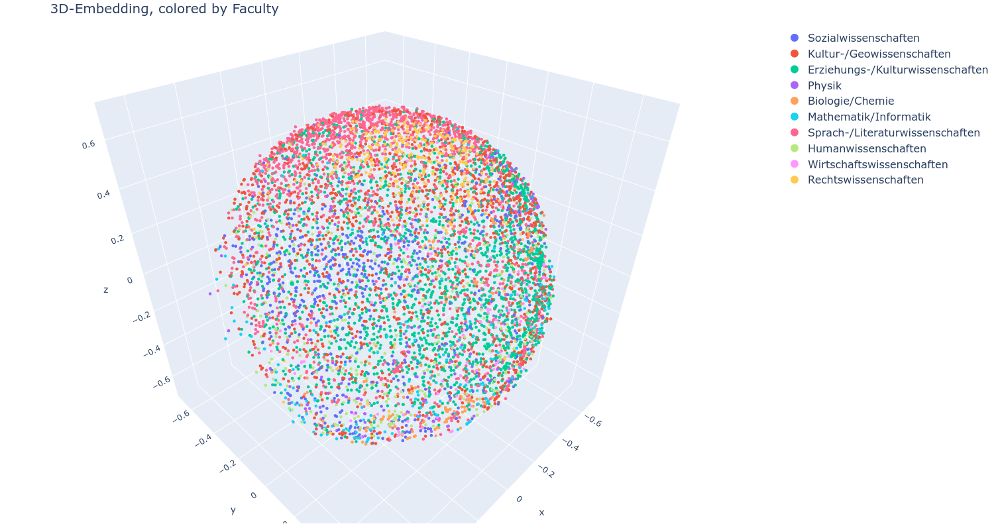

In [6]:
df = pd.DataFrame(np.column_stack((embedding, [getcat(i) for i in hascat])), columns=["x","y","z","faculty"], index=hascat)
scatter_3d(df, "faculty", catnames, descriptions=descriptions);

<br/><br/><br/><br/><br/><br/>
## Plotting the result of t-SNE of the best-performing dissimilarity Matrix

...Dissimiliarity-Matrix, not Embedding! t-SNE is doing the embedding here

In [7]:
ctx, embedding, descriptions, dissim_mat = load_best_conf(perconf_list)
getcat, hascat, catnames = ctx.obj["dataset_class"].get_custom_class("fachbereich", descriptions)

Number of clusters per config: [1, 1, 6, 6, 6, 6, 6, 6, 6, 2, 1, 6, 6, 6, 6, 6, 1, 100, 39, 2, 100, 25, 14, 100, 100, 98, 100, 100, 3, 100, 100, 3, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 1, 364, 50, 1, 313, 46, 26, 179, 171, 169, 74, 264, 179, 236, 4, 400, 239, 3, 400, 245, 400, 400, 157, 400]


<span style="font-size:11pt">Taking one of the configs with the most clusters...</span>

<span style="font-size:11pt">CLASSIFIER: <span style="color: #0000ff">SVM</span>, CLASSIFIER_SUCCMETRIC: <span style="color: #ff0000">kappa_digitized_onlypos_2</span>, CLUSTER_DIRECTION_ALGO: <span style="color: #0000ff">reclassify</span>, DATASET: <span style="color: #ff0000">siddata2022</span>, DCM_QUANT_MEASURE: <span style="color: #0000ff">count</span>, DEBUG: <span style="color: #0000ff">False</span>, EMBED_ALGO: <span style="color: #0000ff">mds</span>, EMBED_DIMENSIONS: <span style="color: #ff0000">200</span>, EXTRACTION_METHOD: <span style="color: #ff0000">tfidf</span>, KAPPA_WEIGHTS: <span style="color: #0000ff">quadratic</span>, LANGUAGE: <span style="color: #0000ff">de</span>, MIN_WORDS_PER_DESC: <span style="color: #ff0000">80</span>, PP_COMPONENTS: <span style="color: #ff0000">mfauhcsd2</span>, PRIM_LAMBDA: <span style="color: #0000ff">0.5</span>, QUANTIFICATION_MEASURE: <span style="color: #ff0000">tfidf</span>, RANDOM_SEED: <span style="color: #ff0000">None</span>, SEC_LAMBDA: <span style="color: #ff0000">0.2</span>, TRANSLATE_POLICY: <span style="color: #0000ff">onlyorig</span></span>

<span style="font-size:11pt">Loading the rest of the necessary config...</span>

<span style="font-size:11pt">loading done.</span>

Dropping 4520/11601 (38.96%) courses - there is no Fachbereich for them
63 courses are assigned more than 1 Fachbereich!


/home/chris/Documents/UNI_neu/Masterarbeit/Derive_Conceptualspace/derive_conceptualspace/load_data/dataset_specifics/siddata2022.py:43: UserWarning:

Will return the first Fachbereich for those ambiguous courses!



In [8]:
dissim_mat = dissim_mat[1][hascat].T[hascat].T
# tsne_emb = TSNE(n_components=2, random_state=0, metric="cosine"); tsne_emb.fit(embedding) #we could also do TSNE on the embedding here
tsne_emb = TSNE(n_components=2, random_state=0, metric="precomputed")
tsne = tsne_emb.fit(dissim_mat)
df = pd.DataFrame(np.column_stack((tsne.embedding_, [getcat(i) for i in hascat])), columns=["x","y","faculty"])

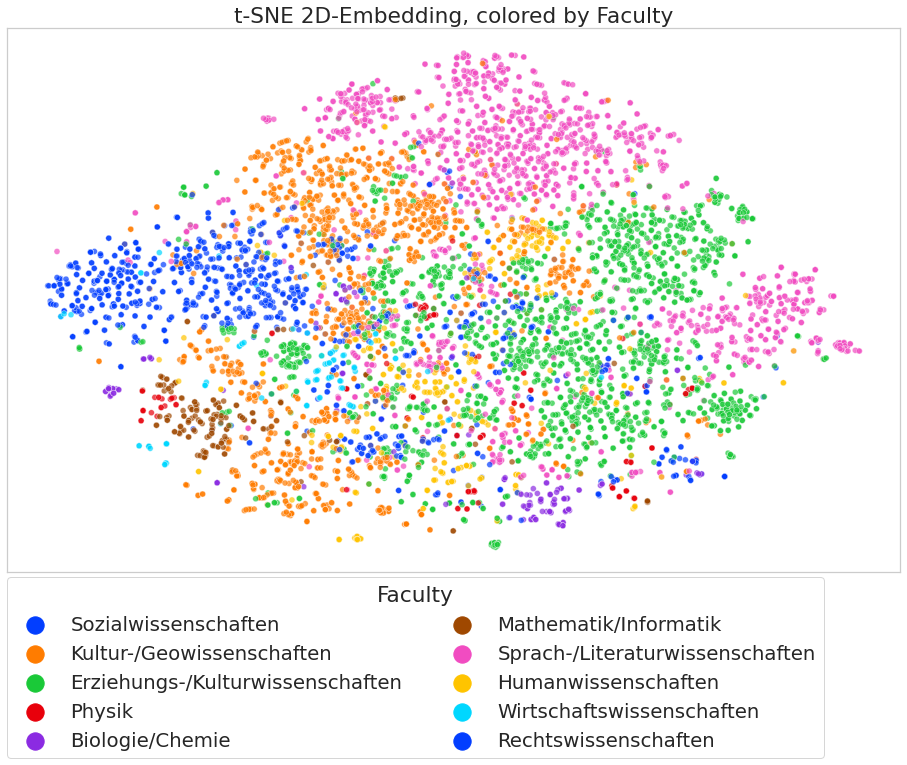

Saved under /home/chris/Documents/UNI_neu/Masterarbeit/data_new/scatter_mds_tsne_4a341d441d.pdf


In [9]:
savepath = join(ctx.p.in_dir, f"scatter_mds_tsne_{ctx.get_important_settings()[0][3:-3]}.pdf")
set_seaborn()
with PdfPages(savepath) as pdf:
    fig = scatter_2d(df, "faculty", catnames)
    pdf.savefig(fig, bbox_inches='tight')
print(f"Saved under {savepath}")

<br><br><br><br><br><br>

# Plotting 1-vs-Rest on the 3D MDS Plot

In [92]:
plot_allagainst = "Sprach-/Literaturwissenschaften"

ctx, embedding, descriptions, dissim_mat = load_best_conf(perconf_list, restrictions=lambda x: x["embed_dimensions"] == 3)
getcat, hascat, catnames = ctx.obj["dataset_class"].get_custom_class("fachbereich", descriptions)
embedding = embedding[hascat]

df = pd.DataFrame(np.column_stack((embedding, [getcat(i) for i in hascat])), columns=["x","y","z","faculty"], index=hascat)
df["faculty"] = df["faculty"] == {v: k for k, v in catnames.items()}[plot_allagainst]
# scatter_3d(df, "faculty", {True: plot_allagainst, False: "Other"}, descriptions=descriptions, name=f"3D-Embedding, One vs Rest: {plot_allagainst}");

Number of clusters per config: [1, 1, 6, 6, 6, 6, 6, 6, 6, 2, 1, 6, 6, 6, 6, 6]


<span style="font-size:11pt">Taking one of the configs with the most clusters...</span>

<span style="font-size:11pt">CLASSIFIER: <span style="color: #0000ff">SVM</span>, CLASSIFIER_SUCCMETRIC: <span style="color: #ff0000">kappa_rank2rank_onlypos_min</span>, CLUSTER_DIRECTION_ALGO: <span style="color: #0000ff">reclassify</span>, DATASET: <span style="color: #ff0000">siddata2022</span>, DCM_QUANT_MEASURE: <span style="color: #0000ff">count</span>, DEBUG: <span style="color: #0000ff">False</span>, EMBED_ALGO: <span style="color: #0000ff">mds</span>, EMBED_DIMENSIONS: <span style="color: #ff0000">3</span>, EXTRACTION_METHOD: <span style="color: #ff0000">tfidf</span>, KAPPA_WEIGHTS: <span style="color: #0000ff">quadratic</span>, LANGUAGE: <span style="color: #0000ff">de</span>, MIN_WORDS_PER_DESC: <span style="color: #ff0000">80</span>, PP_COMPONENTS: <span style="color: #ff0000">mfauhtcsldp</span>, PRIM_LAMBDA: <span style="color: #0000ff">0.5</span>, QUANTIFICATION_MEASURE: <span style="color: #ff0000">ppmi</span>, RANDOM_SEED: <span style="color: #ff0000">None</span>, SEC_LAMBDA: <span style="color: #ff0000">0.2</span>, TRANSLATE_POLICY: <span style="color: #0000ff">onlyorig</span></span>

<span style="font-size:11pt">Loading the rest of the necessary config...</span>

<span style="font-size:11pt">loading done.</span>

Dropping 4623/11942 (38.71%) courses - there is no Fachbereich for them
64 courses are assigned more than 1 Fachbereich!


/home/chris/Documents/UNI_neu/Masterarbeit/Derive_Conceptualspace/derive_conceptualspace/load_data/dataset_specifics/siddata2022.py:43: UserWarning:

Will return the first Fachbereich for those ambiguous courses!



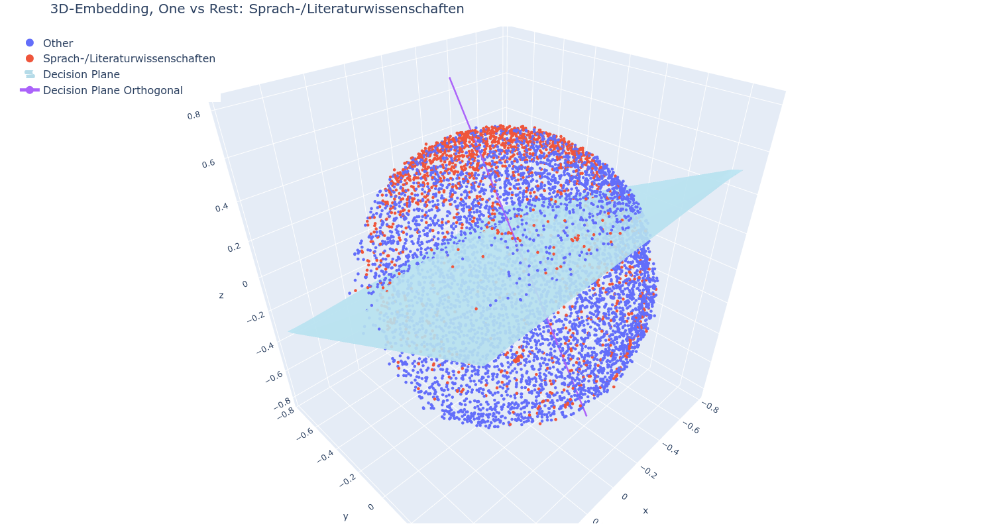

In [96]:
svm = sklearn.svm.LinearSVC(class_weight="balanced", loss="hinge", max_iter=20000)
emb = df[["x","y","z"]].values
svm.fit(emb, df[category])
decision_plane = ThreeDPlane(svm.coef_[0], svm.intercept_[0])
forward, backward = make_base_changer(decision_plane)

prototypicality_pre = lambda x: abs(forward(x)[0])
all_prototyp = [prototypicality_pre(emb[i]) for i in range(len(emb))]
prototypicality = lambda x: round(((prototypicality_pre(x)-min(all_prototyp))/(max(all_prototyp)-min(all_prototyp)))*100, 2)

catnames = {True: plot_allagainst, False: "Other"}
FACTOR = 0.4

with ThreeDFigure(width=1120, name=f"3D-Embedding, One vs Rest: {plot_allagainst}", bigfont=True) as fig:  #forward, backward, swap_axes="xz"
    for ncol, part_df in enumerate(set(df[category])):
        emb = df[df[category] == part_df]
        if descriptions is not None:
            descs = [descriptions._descriptions[i] for i in list(df[df[category] == part_df].index)]
            custom_data = [{"Name": desc.title, "V.Nr.": "|".join(eval(desc._additionals["veranstaltungsnummer"])),
                "Prototypicality": round(prototypicality(emb[["x", "y", "z"]].iloc[n].values), 2),
                "Class": catnames[emb.iloc[n][category]] if catnames else emb.iloc[n][category],  "extra": {"Description":shorten(desc.text, 200) }} for n, desc in enumerate(descs)]
        fig.add_markers(emb[["x", "y", "z"]].values, name=catnames[part_df] if catnames else part_df, color=ncol, size=1.5, custom_data=custom_data)
        
    vals = df[["x", "y", "z"]].values
    fig.add_surface(decision_plane, vals, df[category], margin=0.1, color="lightblue", showlegend=True, name="Decision Plane")
    fig.add_line(vals.mean(axis=0)-decision_plane.normal*FACTOR, vals.mean(axis=0)+decision_plane.normal*FACTOR, width=5, name="Decision Plane Orthogonal") 
#     fig.add_markers([0, 0, 0], size=3, name="Coordinate Center") 
    
    fig.fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
    fig.show()

<span style="font-size:11pt">Accuracy: 67.9% | Precision: 39.8% | Recall: 70.7%</span>

<span style="font-size:11pt">Elements per Class: {'Sprach-/Literaturwissenschaften': 1725, 'Other': 5594}</span>

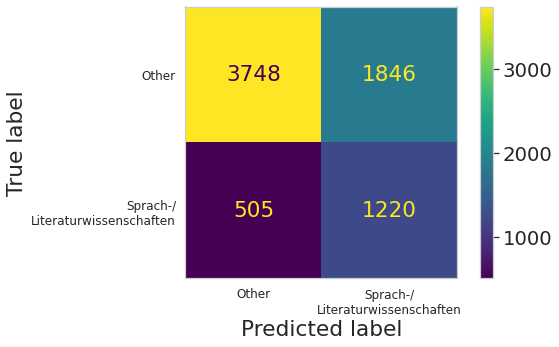

In [180]:
svm_results = svm.predict(df[["x","y","z"]].values)
# correct_preds = [df[category].iloc[i] == (svm_results[i] > 0) for i in range(len(svm_results))]
# display(f"Accuracy of the SVM: {sum(correct_preds)/len(correct_preds):.1%}")
conf_mat = sklearn.metrics.confusion_matrix(y_true=df[category], y_pred=svm_results)
tn, fp, fn, tp = conf_mat.ravel()
precision = tp / (tp + fp)
recall = tp / (tp + fn)
accuracy = (tp + tn) / len(svm_results)
display(f"Accuracy: {accuracy:.1%} | Precision: {precision:.1%} | Recall: {recall:.1%}")

display(f"Elements per Class: {dict(Counter([catnames[i] for i in df[category]]))}")

fig, ax = plt.subplots(figsize=(8, 5))
display_labels = [i[1].replace("/","/\n") for i in sorted(catnames.items(), key=lambda x: x[0])]
plot = sklearn.metrics.ConfusionMatrixDisplay.from_estimator(svm, X=df[["x","y","z"]].values, y=df[category], display_labels=display_labels, ax=ax, xticks_rotation="horizontal");
for item in ([ax.title] + ax.get_xticklabels() + ax.get_yticklabels()): # ax.xaxis.label, ax.yaxis.label
    item.set_fontsize(12)
ax.grid(False)